In [320]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [321]:
#reading data

data=pd.read_csv('Group13\\Classification\\NLS_Group13.txt',header=None,delimiter="\s+",skiprows=1)

In [322]:
print(data.shape)

(2606, 2)


In [323]:
print(data.head())

          0         1
0  7.571705 -8.756260
1 -8.962906  0.459065
2  9.445356 -7.170082
3  0.191872  2.211127
4 -8.807716 -1.548033


In [324]:
data_class1=data.iloc[:1303]
data_class2=data.iloc[1304::]

In [325]:
print(data_class1.shape)
print(data_class1.shape)

(1303, 2)
(1303, 2)


In [326]:
#Splitting data into train-validation-test proportion of 60-20-20

def split_data(data):
    m,n=data.shape
    k=int(0.6*m)
    p=k+int(0.2*m)
    training_data=data.iloc[:k]
    validation_data=data.iloc[k:p]
    test_data=data.iloc[p:m]
    
    return training_data, validation_data, test_data

In [327]:
train1, validation1, test1=split_data(data_class1)
train2, validation2, test2=split_data(data_class2)

In [328]:
print(train1.shape,validation1.shape,test1.shape)
print(train2.shape,validation2.shape,test2.shape)

(781, 2) (260, 2) (262, 2)
(781, 2) (260, 2) (261, 2)


[]

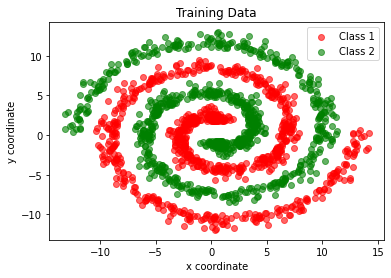

In [329]:
#Plotting training data

plt.scatter(train1[0],train1[1],color='r',alpha=0.6,label='Class 1')
plt.scatter(train2[0],train2[1],color='g',alpha=0.6,label='Class 2')
plt.legend()
plt.title("Training Data")
plt.xlabel('x coordinate')
plt.ylabel('y coordinate')
plt.savefig("FCNN_NLS_Results\\Part1_Q2_train_data.png")
plt.plot()

In [330]:
# linear activation function

def linear(x):
    return x

In [331]:
# Sigmoid activation function

def sigmoid(x,fn='logistic'):
    
    if fn=='logistic':
        return 1/(1+np.exp(-x))
    
    elif fn=='tanh':
        return (np.exp(x)-np.exp(-x))/(np.exp(x)+np.exp(-x))

In [332]:
# Instantaneous error (to be calculated for each pattern)

def instant_error(y,y_pred):
    
    return (1/2)*sum((y-y_pred)**2)

In [333]:
# Gradient of weights between output layer and hidden layer 1

def output_gradient(y,y_pred,h2,eta=0.01,act_fn='logistic'):
    
    if act_fn=='logistic':
        del_1=(y-y_pred)*y_pred*(1-y_pred)
        return eta*np.outer(h2,del_1),del_1     
    
    elif act_fn=='tanh':
        del_1=(y-y_pred)*(1-(y_pred**2))
        return eta*np.outer(h2,del_1),del_1

In [334]:
# Gradient of weights between input layer and hidden layer 1

def hidden_gradient(w_o,h2,h1,del_1,eta=0.001,act_fn='logistic'):
    
    w_o=w_o[1:,:]           # l=1 to L so we remove first row
    if act_fn=='logistic':
        del_2=np.dot(w_o,del_1)*h2*(1-h2)
        return eta*np.outer(h1,del_2),del_2   
    
    elif act_fn=='tanh':
        del_2=np.dot(w_o,del_1)*(1-(h2**2))
        return eta*np.outer(h1,del_2),del_2

In [335]:
def train_network(data,validation,J=4,L=4,eta=0.001,epoch=10,error_threshold=0.01,hidden_act='logistic',output_act='logistic',track_performance=False,plot_error=True):
    
    m,n=data.shape
    
    # initialize weight matrix from input to hidden layer 1 of size (d+1,J) where d is the number of features in input
    # pattern and J is number of hidden units in the first hidden layer
    
    w_h1=np.random.randn(3,J)

    # initialise weight matrix between hidden layer 1 and hidden layer 2 of size (J+1,L) where L is the number of units
    # in second hidden layer.
    
    w_h2= np.random.randn(J+1,L)
    
    # initialise weight matrix between hidden layer 2 and output layer of size (L+1,K) where K is the number of classes
    
    w_o=np.random.randn(L+1,2)
    
    error=[]               # list of errors for each pattern in each epoch
    avg_error=[]           # list of average error for each epoch
    avg_e=10**5
    avg_valid_error=[]
    j=1
    while epoch!=0 and avg_e>error_threshold:
        valid_err=[];g1_lst=[];g2_lst=[];s_lst=[]
        for i in range(m):
            x_n=np.array([1,data.iloc[i,0],data.iloc[i,1]])         # concatenating 1 for bias term
            x_n=linear(x_n)                                         # linear activation function at input layer
            
            a_1=np.dot(w_h1.T,x_n)                                   # activation value
            g_1=sigmoid(a_1,hidden_act)                             # activation function at hidden layer 1
            h_1=np.concatenate((np.array([1]),g_1))                 # concatenating 1 for bias term
            g1_lst.append(g_1)

            a_2=np.dot(w_h2.T,h_1)                                   # activation value
            g_2=sigmoid(a_2,hidden_act)                             # activation function at hidden layer 2
            h_2=np.concatenate((np.array([1]),g_2))                 # concatenating 1 for bias term
            g2_lst.append(g_2)

            a_o=np.dot(w_o.T,h_2)                                   # activation value
            s_n=sigmoid(a_o,output_act)                             # activation function at output layer
            s_lst.append(s_n)
            
            # calculate error
            
            if i<int(m/2):
                y_n=[1,0]
            else:
                y_n=[0,1]
                
            e_n=instant_error(np.array(y_n),s_n)
            error.append(e_n)
            
            
            
            # Backpropagation operations
            
            w_o_grad,del1=output_gradient(y_n,s_n,h_2,eta=eta,act_fn=output_act)
            w_o+=w_o_grad
            
            w_h2_grad,del2=hidden_gradient(w_o,g_2,h_1,del1,eta=0.001,act_fn=hidden_act)
            w_h2+=w_h2_grad
            
            w_h1_grad,del3=hidden_gradient(w_h2,g_1,x_n,del2,eta=0.001,act_fn=hidden_act)
            w_h1+=w_h1_grad
        
        # testing model on validation set
        if j==1 or j%10==0:
            y_pred,g1,g2,s=test_model(validation,w_h1,w_h2,w_o,hidden_act=hidden_act,output_act=output_act)
        
            # calculate validation error
            n=len(y_pred)
            for k in range(n): 
                if k<int(n/2):
                    y_k=[1,0]
                else:
                    y_k=[0,1]
                if y_pred[k]==1:
                    y_p=[1,0]
                else:
                    y_p=[0,1]

                err_k=instant_error(np.array(y_k),np.array(y_p))
                valid_err.append(err_k)                 # validation error after each epoch
        
        avg_e=sum(error)/len(error)                     # average error at each epoch
        avg_error.append(avg_e)
        if j==1 or j%10==0:
            avg_valid_err=sum(valid_err)/len(valid_err)     # average validation error at each epoch
          #  avg_valid_error.append(avg_valid_err)
        
        if track_performance==True:
            if j==1 or j%10==0:
                print("Epoch: ",j,end="\n")
                print("Training error: ",avg_e,'\t')
                print("Validation error: ",avg_valid_err)
                
        j+=1
        epoch-=1

    final_error=avg_e               # final error after convergence
    final_valid_error=avg_valid_err   # final error after convergence
    
    if plot_error==True:
        plt.figure(figsize=(8,6))
        plt.plot(avg_error,label='hidden 1: '+str(J)+'\n hidden 2: '+str(L))
        plt.legend()
        plt.title("Average Error vs Epoch")
        plt.xlabel("Epoch")
        plt.ylabel("Average Error")
        plt.xticks(np.arange(1,len(avg_error),500))
        plt.savefig("FCNN_NLS_Results\\Part1_Q2_avg_error_"+str(J)+"_"+str(L)+"hidden_units_"+str(epoch)+"epochs.png")
        plt.show()

        plt.figure(figsize=(8,6))
        plt.plot(avg_valid_error,label='hidden 1: '+str(J)+'\n hidden 2: '+str(L))
        plt.legend()
        plt.title("Average validation error vs epoch")
        plt.xlabel("Epoch")
        plt.ylabel("Average validation error")
        plt.xticks(np.arange(1,len(avg_error)*10,50))
        plt.savefig("FCNN_NLS_Results\\Part1_Q2_avg_valid_error_"+str(J)+"_"+str(L)+"hidden_units_"+str(epoch)+"epochs.png")
        plt.show()
        
    return w_h1,w_h2,w_o,avg_error,final_error,final_valid_error,J,L,np.array(g1_lst).T,np.array(g2_lst).T,np.array(s_lst).T

In [336]:
# Testing unseen data

def test_model(test,w_h1,w_h2,w_o,hidden_act='logistic',output_act='logistic'):
    
    m,n=test.shape
    y_pred=[]           # predicted label
    g1_lst=[]
    g2_lst=[]
    s_lst=[]
    for i in range(m):
        x_n=np.array([1,test.iloc[i,0],test.iloc[i,1]])
        x_n=linear(x_n)                                         # linear activation function at input layer

        a_1=np.dot(w_h1.T,x_n)                                   # activation value
        g_1=sigmoid(a_1,hidden_act)                             # activation function at hidden layer 1
        h_1=np.concatenate((np.array([1]),g_1))                 # concatenating 1 for bias term
        g1_lst.append(g_1)

        a_2=np.dot(w_h2.T,h_1)                                   # activation value
        g_2=sigmoid(a_2,hidden_act)                             # activation function at hidden layer 2
        h_2=np.concatenate((np.array([1]),g_2))                 # concatenating 1 for bias term
        g2_lst.append(g_2)

        a_o=np.dot(w_o.T,h_2)                                   # activation value
        s_n=sigmoid(a_o,output_act)                             # activation function at output layer
        s_lst.append(s_n)
            
        max_val=np.max(s_n)
        if s_n[0]==max_val:
            y_n=1
        else:
            y_n=2
        
        y_pred.append(y_n)
            
    return y_pred,np.array(g1_lst).T,np.array(g2_lst).T,np.array(s_lst).T

# Model training

Training model...
Epoch:  1
Training error:  0.40973861718340593 	
Validation error:  0.47115384615384615
Epoch:  10
Training error:  0.2958423085992986 	
Validation error:  0.4480769230769231
Epoch:  20
Training error:  0.2654104873923539 	
Validation error:  0.4673076923076923
Epoch:  30
Training error:  0.2527102057405905 	
Validation error:  0.46153846153846156
Epoch:  40
Training error:  0.24489241519410068 	
Validation error:  0.4326923076923077
Epoch:  50
Training error:  0.23861282628241579 	
Validation error:  0.39615384615384613
Epoch:  60
Training error:  0.23184781950708755 	
Validation error:  0.375
Epoch:  70
Training error:  0.22593049663758566 	
Validation error:  0.36538461538461536
Epoch:  80
Training error:  0.22090107088707756 	
Validation error:  0.3576923076923077
Epoch:  90
Training error:  0.2166066530608239 	
Validation error:  0.3557692307692308
Epoch:  100
Training error:  0.2129302800068767 	
Validation error:  0.35192307692307695
Epoch:  110
Training error:

Epoch:  930
Training error:  0.1318195933222935 	
Validation error:  0.3038461538461538
Epoch:  940
Training error:  0.1311133222321521 	
Validation error:  0.31153846153846154
Epoch:  950
Training error:  0.13041309863591366 	
Validation error:  0.3173076923076923
Epoch:  960
Training error:  0.12969142136594006 	
Validation error:  0.3
Epoch:  970
Training error:  0.12891633401350355 	
Validation error:  0.2923076923076923
Epoch:  980
Training error:  0.12810952925675065 	
Validation error:  0.2846153846153846
Epoch:  990
Training error:  0.1272807283362457 	
Validation error:  0.27884615384615385
Epoch:  1000
Training error:  0.12643951772281115 	
Validation error:  0.2826923076923077
Epoch:  1010
Training error:  0.125590300584172 	
Validation error:  0.2846153846153846
Epoch:  1020
Training error:  0.12474037813129324 	
Validation error:  0.275
Epoch:  1030
Training error:  0.12388626397453767 	
Validation error:  0.2923076923076923
Epoch:  1040
Training error:  0.1230287192614217

Epoch:  1870
Training error:  0.07635650273704947 	
Validation error:  0.25576923076923075
Epoch:  1880
Training error:  0.07602389016742064 	
Validation error:  0.25384615384615383
Epoch:  1890
Training error:  0.07569461295793675 	
Validation error:  0.25384615384615383
Epoch:  1900
Training error:  0.0753686088157012 	
Validation error:  0.2519230769230769
Epoch:  1910
Training error:  0.07504581469423179 	
Validation error:  0.25384615384615383
Epoch:  1920
Training error:  0.07472616690598217 	
Validation error:  0.2519230769230769
Epoch:  1930
Training error:  0.07440960136866821 	
Validation error:  0.25
Epoch:  1940
Training error:  0.07409605406324726 	
Validation error:  0.24807692307692308
Epoch:  1950
Training error:  0.07378546173998675 	
Validation error:  0.24615384615384617
Epoch:  1960
Training error:  0.07347776272545957 	
Validation error:  0.24615384615384617
Epoch:  1970
Training error:  0.07317289714774854 	
Validation error:  0.24423076923076922
Epoch:  1980
Trai

Epoch:  2780
Training error:  0.05519322970486797 	
Validation error:  0.2326923076923077
Epoch:  2790
Training error:  0.05503102246033265 	
Validation error:  0.2326923076923077
Epoch:  2800
Training error:  0.05486976292575062 	
Validation error:  0.23076923076923078
Epoch:  2810
Training error:  0.0547094796574685 	
Validation error:  0.23076923076923078
Epoch:  2820
Training error:  0.054550189164000853 	
Validation error:  0.23076923076923078
Epoch:  2830
Training error:  0.05439189840903471 	
Validation error:  0.23076923076923078
Epoch:  2840
Training error:  0.054234609471481794 	
Validation error:  0.2326923076923077
Epoch:  2850
Training error:  0.054078322697788124 	
Validation error:  0.2326923076923077
Epoch:  2860
Training error:  0.05392303918183091 	
Validation error:  0.2326923076923077
Epoch:  2870
Training error:  0.053768763528555266 	
Validation error:  0.2326923076923077
Epoch:  2880
Training error:  0.053615508847404354 	
Validation error:  0.23076923076923078
E

Epoch:  3700
Training error:  0.04390300667818288 	
Validation error:  0.18461538461538463
Epoch:  3710
Training error:  0.04380212812441326 	
Validation error:  0.18653846153846154
Epoch:  3720
Training error:  0.04370135149261275 	
Validation error:  0.18653846153846154
Epoch:  3730
Training error:  0.043600832573803934 	
Validation error:  0.18269230769230768
Epoch:  3740
Training error:  0.043500616261874236 	
Validation error:  0.17884615384615385
Epoch:  3750
Training error:  0.04340072757135941 	
Validation error:  0.17884615384615385
Epoch:  3760
Training error:  0.043301183836676714 	
Validation error:  0.17692307692307693
Epoch:  3770
Training error:  0.043201998443856804 	
Validation error:  0.17307692307692307
Epoch:  3780
Training error:  0.04310318154022057 	
Validation error:  0.175
Epoch:  3790
Training error:  0.04300474012984039 	
Validation error:  0.17884615384615385
Epoch:  3800
Training error:  0.04290667861033129 	
Validation error:  0.17692307692307693
Epoch:  3

Epoch:  4610
Training error:  0.03621202128846889 	
Validation error:  0.11538461538461539
Epoch:  4620
Training error:  0.03614118077829256 	
Validation error:  0.11153846153846154
Epoch:  4630
Training error:  0.03607051577975183 	
Validation error:  0.10961538461538461
Epoch:  4640
Training error:  0.03600003086068776 	
Validation error:  0.1076923076923077
Epoch:  4650
Training error:  0.03592973885769048 	
Validation error:  0.10576923076923077
Epoch:  4660
Training error:  0.035859649838622505 	
Validation error:  0.10384615384615385
Epoch:  4670
Training error:  0.03578976989471844 	
Validation error:  0.10576923076923077
Epoch:  4680
Training error:  0.03572010355785885 	
Validation error:  0.10384615384615385
Epoch:  4690
Training error:  0.03565065488758726 	
Validation error:  0.10384615384615385
Epoch:  4700
Training error:  0.03558142754663327 	
Validation error:  0.10384615384615385
Epoch:  4710
Training error:  0.03551242462924748 	
Validation error:  0.10192307692307692

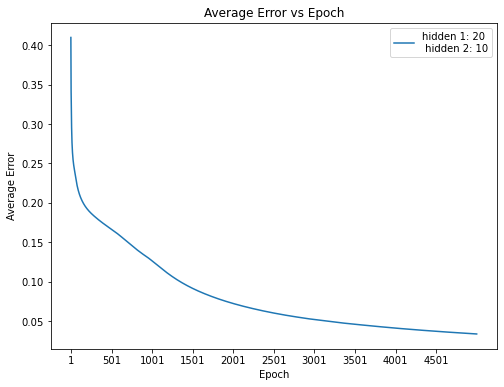

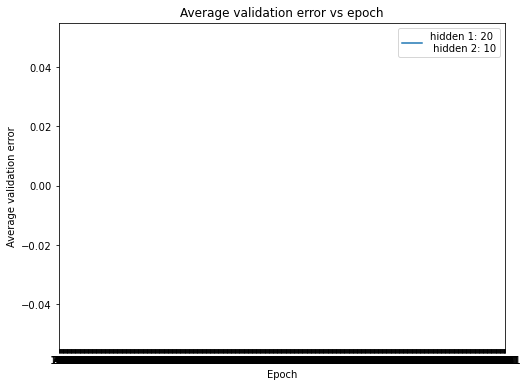

In [337]:
# Preparing combined training data

train=train1.append(train2,ignore_index=True)
valid=validation1.append(validation2,ignore_index=True)
print("Training model...")
w_h1,w_h2,w_out,avg_err,final_err,valid_err,J,L,g1_train,g2_train,s_train=train_network(train,valid,J=20,L=10,eta=0.01,epoch=5000,error_threshold=0.001,
                                            hidden_act='tanh',output_act='logistic',track_performance=True,plot_error=True)

In [338]:
print('Updated parameters: \n')
print('Weight matrix for hidden layer 1: \n {} \n\n Weight matrix for hidden layer 2: \n {} \n \n Weight vector for output layer:\n {} \n\n Train error: {} \n\n Validation error: {}'.format(w_h1,w_h2,w_out,final_err,valid_err))

Updated parameters: 

Weight matrix for hidden layer 1: 
 [[-5.24233193e-01  2.83148773e+00  4.29384353e+00  2.86989158e+00
   1.36688264e+00  1.02091708e+00  8.84192104e-03  2.65043207e-01
   2.99301193e+00 -1.94213500e+00  1.00415654e+00 -2.77556190e+00
   1.36301324e-01  4.49644361e+00  2.27824549e+00 -3.34622842e-01
   8.61082768e-01  3.31413313e-03  6.89997720e-01  3.14535477e+00]
 [-1.41834787e+00 -5.08175649e-01 -6.23120815e-01 -4.53748641e-01
   2.36635339e-01  9.26792678e-01 -9.74909203e-02 -4.25027247e-01
   4.89752278e-01 -3.28234535e-01 -3.10172761e-01  9.43754488e-01
  -8.14035183e-01  2.81459091e-01 -1.18695536e-01  7.69210770e-01
   8.03056092e-02 -3.52307066e-01 -1.63097261e+00  5.48770466e-01]
 [-2.19847240e-01  3.66309271e-01 -1.27487598e+00 -2.90216017e-01
   9.01625826e-02 -1.19915497e+00 -1.61980661e+00 -2.45667482e+00
  -3.51722396e-01 -9.21230597e-01 -1.70574261e-02 -4.07379704e-01
   1.59144240e+00 -4.62358240e-01  1.12364366e+00  7.26816436e-01
  -3.14116379e-0

# Plotting decision boundary

In [339]:
x_min=min([min(data_class1.iloc[0]),min(data_class2.iloc[0])])
x_max=max([max(data_class1.iloc[0]),max(data_class2.iloc[0])])
y_min=min([min(data_class1.iloc[1]),min(data_class2.iloc[1])])
y_max=max([max(data_class1.iloc[1]),max(data_class2.iloc[1])])

xx, yy = np.meshgrid(np.arange(x_min-15, x_max+15, 0.1), np.arange(y_min-15, y_max+15, 0.1))
meshgrid=np.c_[xx.ravel(),yy.ravel()]       # flatten meshgrid and concatenate to create points

In [340]:
def decision_region(meshgrid,data1,data2,w_h1,w_h2,w_o,hidden_act='logistic',output_act='logistic'):
    
    c1=[];c2=[]
    
    # compute output for complete mesh
    
    meshgrid=pd.DataFrame(meshgrid)
    y_pred,g1,g2,s=test_model(meshgrid,w_h1,w_h2,w_o,hidden_act,output_act)
    m,n=meshgrid.shape

    for i in range(m):
        if y_pred[i]==1:
            c1.append((meshgrid.iloc[i,0],meshgrid.iloc[i,1]))
            
        else:
            c2.append((meshgrid.iloc[i,0],meshgrid.iloc[i,1]))
    
    c1=np.array(c1)
    c2=np.array(c2)
    
    J=w_h2.shape[0]-1
    L=w_o.shape[0]-1
    plt.figure(figsize=(8,6))
    plt.scatter(c1[:,0],c1[:,1],color='coral',label="Region 1")
    plt.scatter(c2[:,0],c2[:,1],color='lightskyblue',label="Region 2")
    plt.scatter(data1[0],data1[1],color='red',edgecolors='black',alpha=0.6,label="Class 1")
    plt.scatter(data2[0],data2[1],color='steelblue',edgecolors='black',alpha=0.6,label="Class 2")
    plt.legend(loc="best")
    plt.title('Multi-class decision region.')
    plt.xlabel('x coordinate')
    plt.ylabel('y coordinate')
    plt.savefig("FCNN_NLS_Results\\Part1_Q2_decision_region_"+str(J)+"hidden1_"+str(L)+"hidden2.png")
    plt.show()
    
    #return [c1,c2,c3]

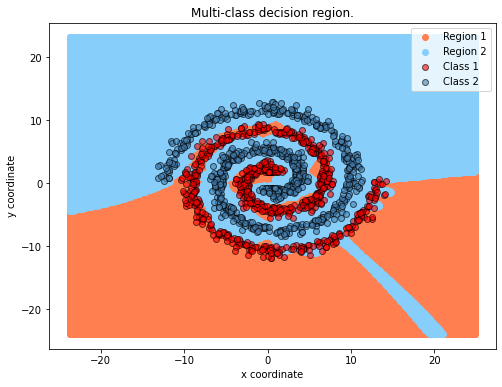

In [341]:
decision_region(meshgrid,train1,train2,w_h1,w_h2,w_out,hidden_act='tanh',output_act='logistic')

# Testing model

In [342]:
# Testing on validation data

valid_pred,g1_valid,g2_valid,s_valid=test_model(valid,w_h1,w_h2,w_out,hidden_act='tanh',output_act='logistic')

# Preparing combined test data

test=test1.append(test2,ignore_index=True)
print("Testing model...")
y_pred,g1_test,g2_test,s_test=test_model(test,w_h1,w_h2,w_out,hidden_act='tanh',output_act='logistic')

Testing model...


In [343]:
# Confusion Matrix

def confusion_matrix(y_pred):
    
    mat=np.zeros((2,2))
    
    n=int(len(y_pred)/2)
    for i in range(len(y_pred)):
        if i<n:                      # true class is 1
            if y_pred[i]==1:
                mat[0][0]+=1
            else:
                mat[1][0]+=1
        else:                        # true class is 2
            if y_pred[i]==1:
                mat[0][1]+=1
            else:
                mat[1][1]+=1
    
    return mat.astype(int)

In [344]:
# Classification accuracy

def accuracy(TP1,TP2,total):
    return ((TP1+TP2)/total)*100

In [345]:
# Precision for a classifier

def precision(TP,FP):
    return TP/(TP+FP)

In [346]:
# recall for a classifier

def recall(TP,FN):
    return TP/(TP+FN)

In [347]:
# F-measure of a classifier

def f_measure(precision,recall):
    return 2*precision*recall/(precision+recall)

# Performance measure on validation data

In [348]:
conf_mat_valid=confusion_matrix(valid_pred)

In [349]:
print("Confusion Matrix for validation data")
print(conf_mat_valid)
acc_valid=accuracy(conf_mat_valid[0][0],conf_mat_valid[1][1],len(valid_pred))
print("Accuracy of model on validation data: ",acc_valid)

Confusion Matrix for validation data
[[220  12]
 [ 40 248]]
Accuracy of model on validation data:  90.0


# Performance measures on test data

In [350]:
conf_mat=confusion_matrix(y_pred)

In [351]:
print("Confusion Matrix for 2-class classification")
print(conf_mat)
acc=accuracy(conf_mat[0][0],conf_mat[1][1],len(y_pred))
print("Accuracy of model: ",acc)

Confusion Matrix for 2-class classification
[[214  15]
 [ 47 247]]
Accuracy of model:  88.14531548757171


In [352]:
precision1=precision(conf_mat[0][0],conf_mat[0][1])
precision2=precision(conf_mat[1][1],conf_mat[1][0])
precision_lst=[precision1,precision2]

In [353]:
for i in range(len(precision_lst)):
    print('Precision for class '+str(i+1)+': ',precision_lst[i])
    
print("Average precision: ",(np.mean(precision_lst)))

Precision for class 1:  0.9344978165938864
Precision for class 2:  0.8401360544217688
Average precision:  0.8873169355078276


In [354]:
recall1=recall(conf_mat[0][0],conf_mat[1][0])
recall2=recall(conf_mat[1][1],conf_mat[0][1])
recall_lst=[recall1,recall2]

In [355]:
for i in range(len(recall_lst)):
    print('Recall for class '+str(i+1)+': ',recall_lst[i])
    
print("Average recall: ",(np.mean(recall_lst)))

Recall for class 1:  0.8199233716475096
Recall for class 2:  0.9427480916030534
Average recall:  0.8813357316252814


In [356]:
f1=f_measure(precision1,recall1)
f2=f_measure(precision2,recall2)
f_lst=[f1,f2]

In [357]:
for i in range(len(f_lst)):
    print('F-measure for class '+str(i+1)+': ',recall_lst[i])
    
print("Average f-measure: ",(np.mean(f_lst)))

F-measure for class 1:  0.8199233716475096
F-measure for class 2:  0.9427480916030534
Average f-measure:  0.8809792981940978


# 3D plots for hidden and output unit results on training, validation and test data

In [358]:
from mpl_toolkits.mplot3d import Axes3D

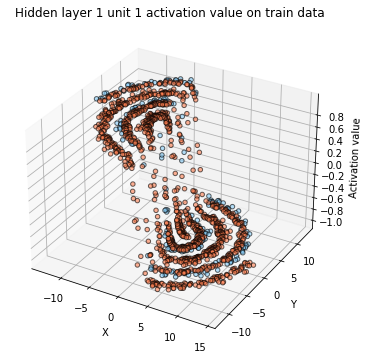

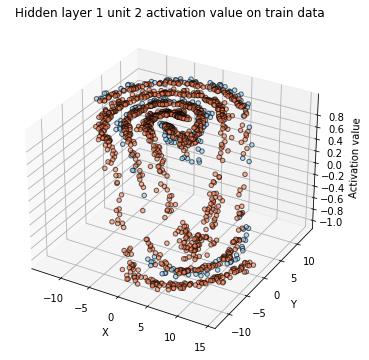

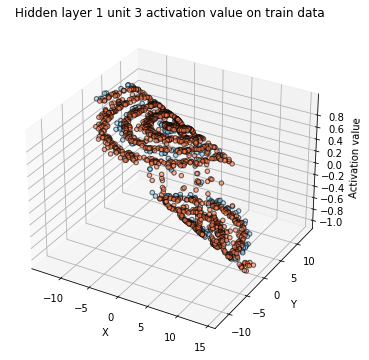

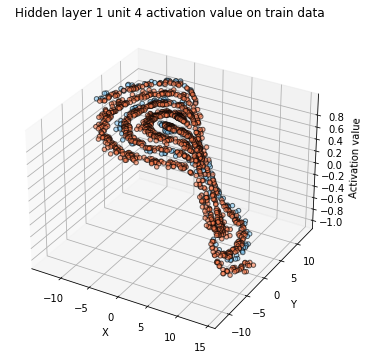

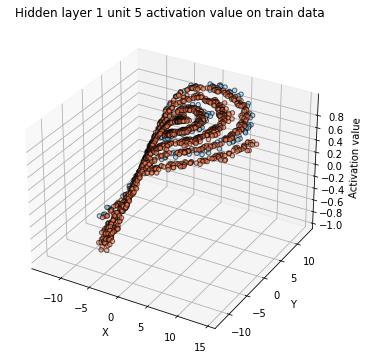

...

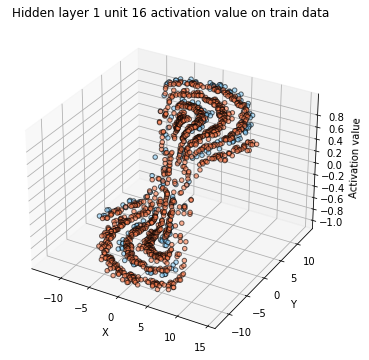

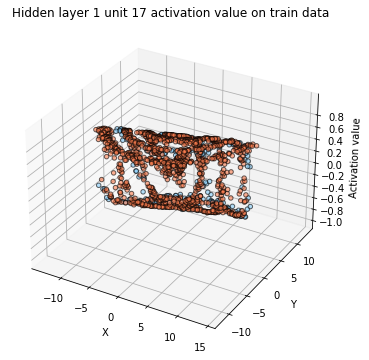

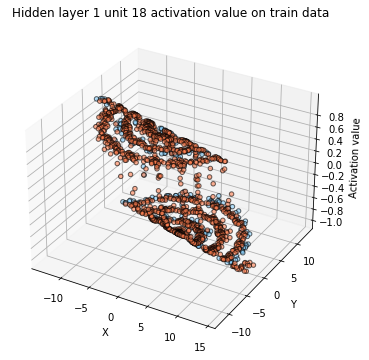

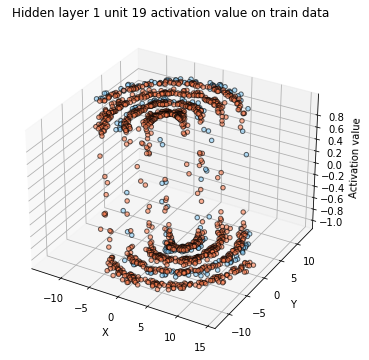

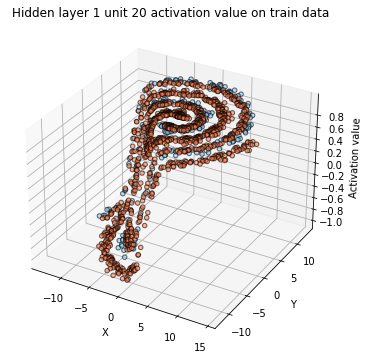

In [359]:
# plotting hidden units activation value for first hidden layer on training data

m1,n1=g1_train.shape
for i in range(m1):
    Z=g1_train[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(train[0][:1303],train[1][:1303], Z[:1303], c='coral',alpha=0.6,edgecolors='black')
    ax.scatter(train[0][1304:2606],train[1][1304:2606], Z[1304:2606], c='lightskyblue',alpha=0.6,edgecolors='black')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Activation value')
    ax.set_title(f'Hidden layer 1 unit {i+1} activation value on train data')
    ax.set_zticks(np.arange(-1,1,0.2))
    plt.savefig("FCNN_NLS_Results\\Part1_Q2_"+str(i+1)+"hidden_neuron_train_layer1"+str(J)+".png")
    plt.show()

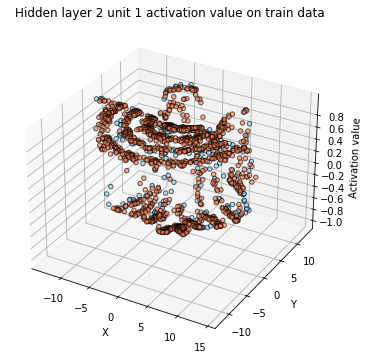

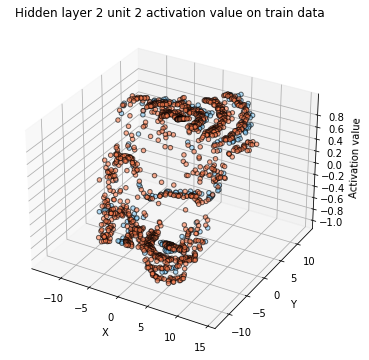

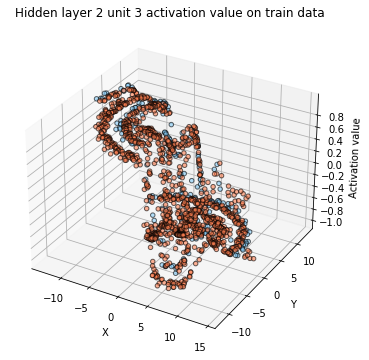

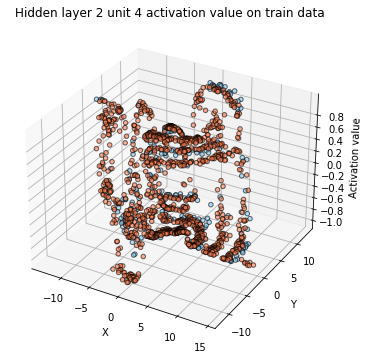

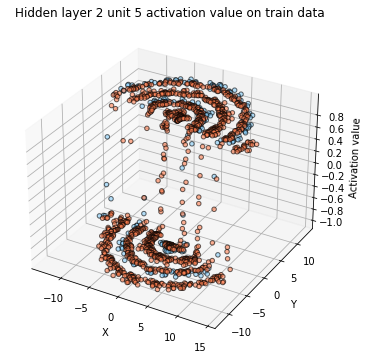

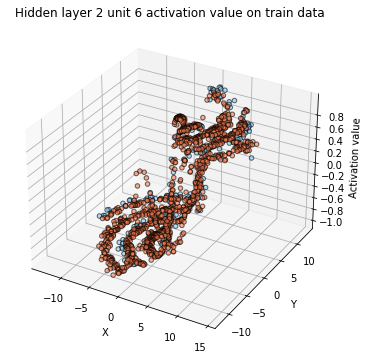

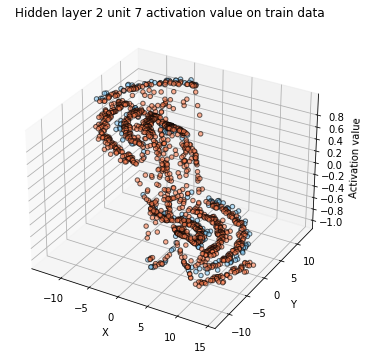

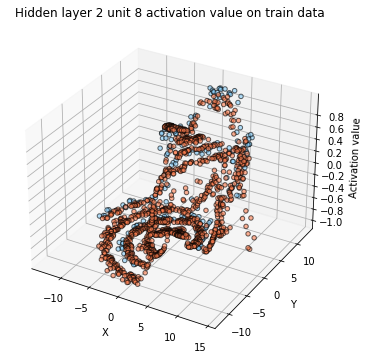

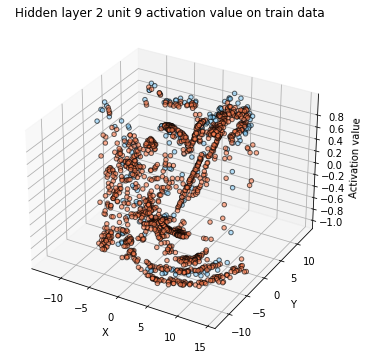

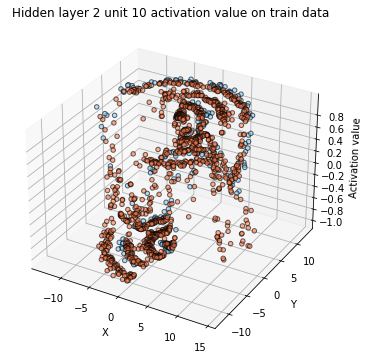

In [360]:
# plotting hidden units activation value for second hidden layer on training data

m1,n1=g2_train.shape
for i in range(m1):
    Z=g2_train[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(train[0][:1303],train[1][:1303], Z[:1303], c='coral',alpha=0.6,edgecolors='black')
    ax.scatter(train[0][1304:2606],train[1][1304:2606], Z[1304:2606], c='lightskyblue',alpha=0.6,edgecolors='black')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Activation value')
    ax.set_title(f'Hidden layer 2 unit {i+1} activation value on train data')
    ax.set_zticks(np.arange(-1,1,0.2))
    plt.savefig("FCNN_NLS_Results\\Part1_Q2_"+str(i+1)+"hidden_neuron_train_layer2"+str(L)+".png")
    plt.show()

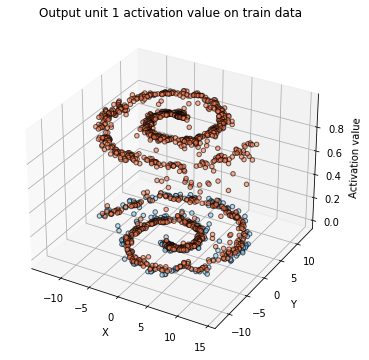

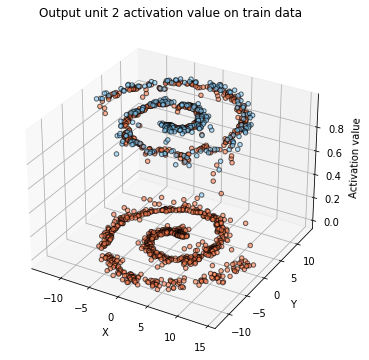

In [361]:
# plotting output units activation value on training data

m1,n1=s_train.shape
for i in range(m1):
    Z=s_train[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(train[0][:1303],train[1][:1303], Z[:1303], c='coral',alpha=0.6,edgecolors='black')
    ax.scatter(train[0][1304:2606],train[1][1304:2606], Z[1304:2606], c='lightskyblue',alpha=0.6,edgecolors='black')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Activation value')
    ax.set_title(f'Output unit {i+1} activation value on train data')
    ax.set_zticks(np.arange(0,1,0.2))
    plt.savefig("FCNN_NLS_Results\\Part1_Q2_"+str(i+1)+"output_neuron_train_.png")
    plt.show()

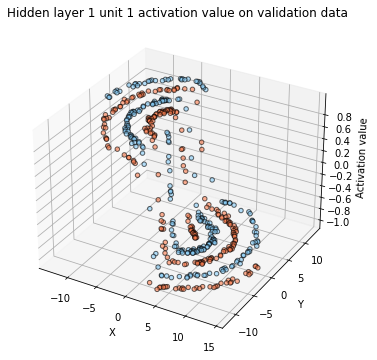

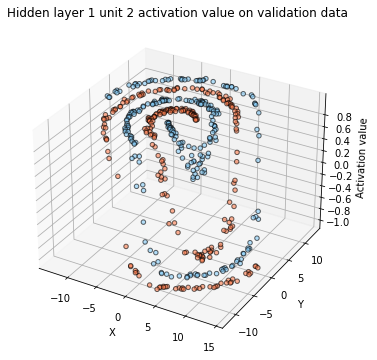

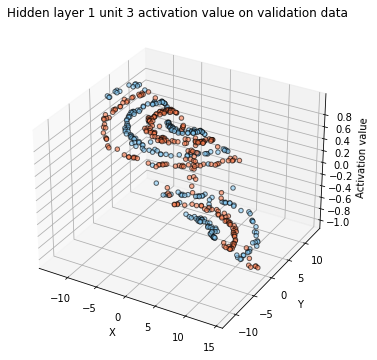

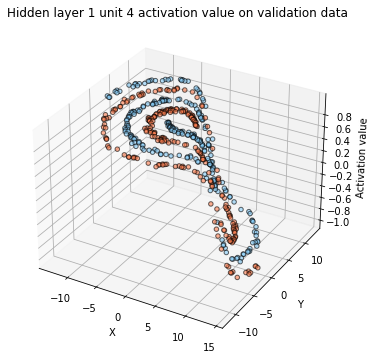

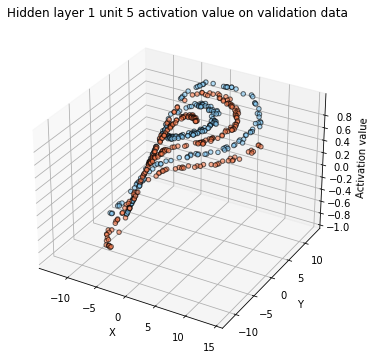

...

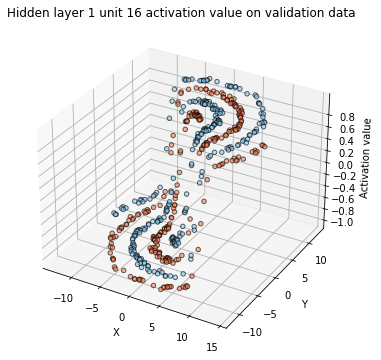

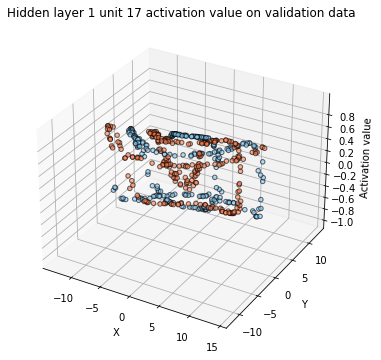

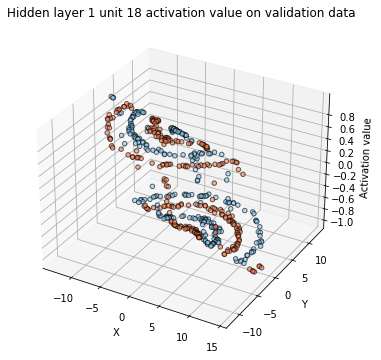

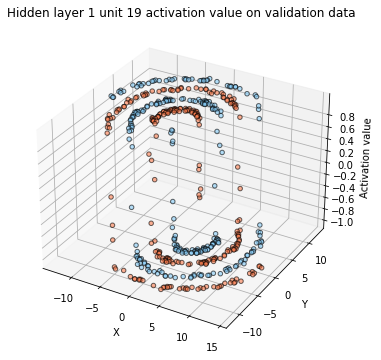

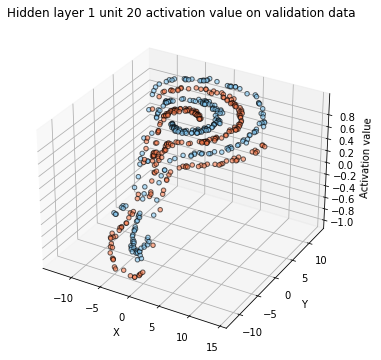

In [362]:
# plotting hidden units activation value for first hidden layer on validation data

m1,n1=g1_valid.shape
for i in range(m1):
    Z=g1_valid[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(valid[0][:int(n1/2)],valid[1][:int(n1/2)], Z[:int(n1/2)], c='coral',alpha=0.6,edgecolors='black')
    ax.scatter(valid[0][int(n1/2)+1::],valid[1][int(n1/2)+1::], Z[int(n1/2)+1::], c='lightskyblue',alpha=0.6,edgecolors='black')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Activation value')
    ax.set_title(f'Hidden layer 1 unit {i+1} activation value on validation data')
    ax.set_zticks(np.arange(-1,1,0.2))
    plt.savefig("FCNN_NLS_Results\\Part1_Q2_"+str(i+1)+"hidden_neuron_valid_layer1"+str(J)+".png")
    plt.show()

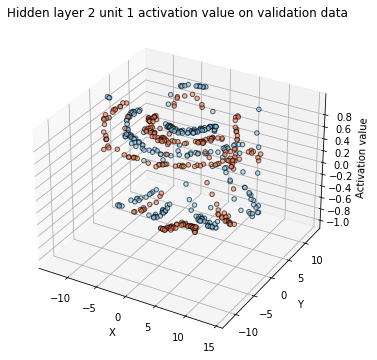

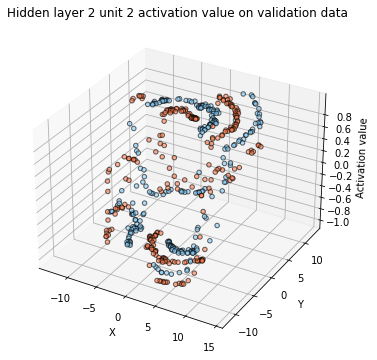

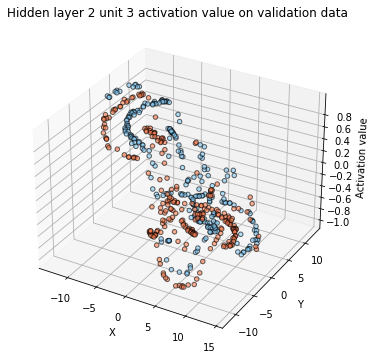

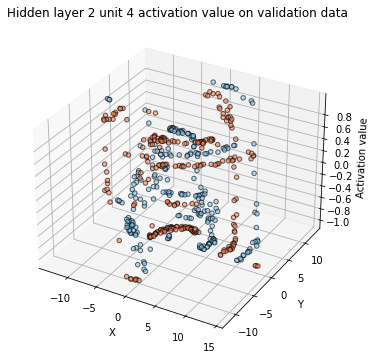

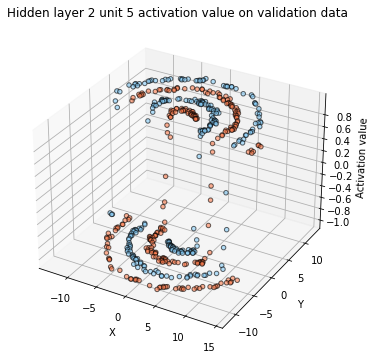

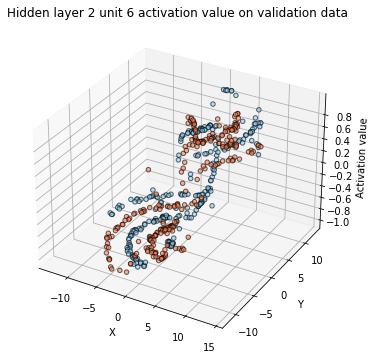

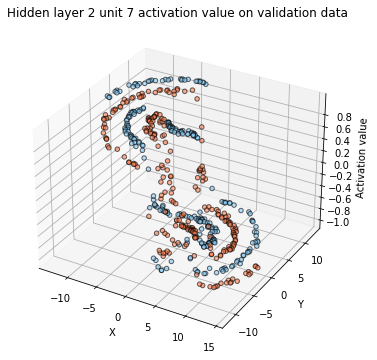

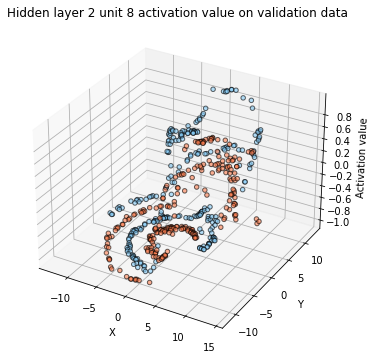

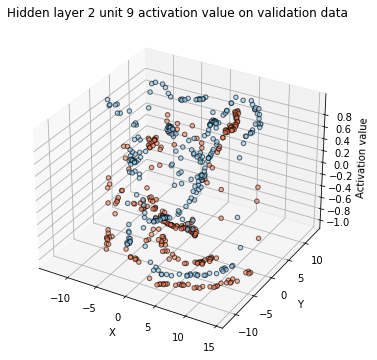

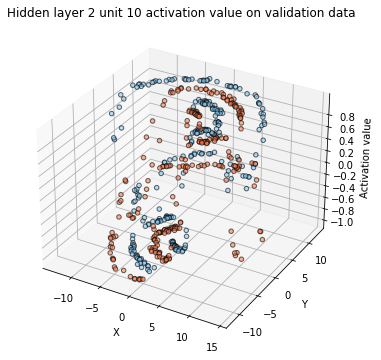

In [363]:
# plotting hidden units activation value for first hidden layer on validation data

m1,n1=g2_valid.shape
for i in range(m1):
    Z=g2_valid[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(valid[0][:int(n1/2)],valid[1][:int(n1/2)], Z[:int(n1/2)], c='coral',alpha=0.6,edgecolors='black')
    ax.scatter(valid[0][int(n1/2)+1::],valid[1][int(n1/2)+1::], Z[int(n1/2)+1::], c='lightskyblue',alpha=0.6,edgecolors='black')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Activation value')
    ax.set_title(f'Hidden layer 2 unit {i+1} activation value on validation data')
    ax.set_zticks(np.arange(-1,1,0.2))
    plt.savefig("FCNN_NLS_Results\\Part1_Q2_"+str(i+1)+"hidden_neuron_valid_layer2"+str(L)+".png")
    plt.show()

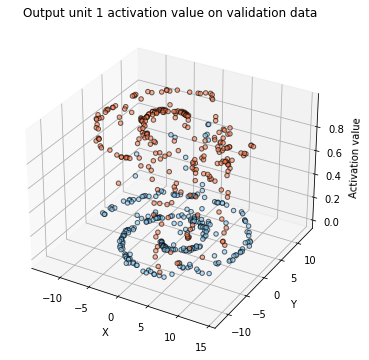

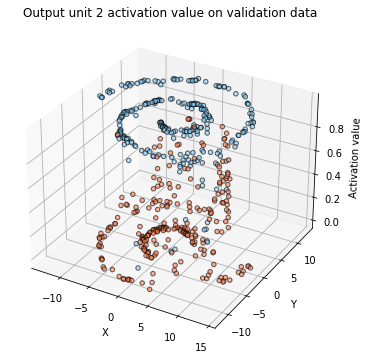

In [364]:
# plotting output units activation value on validation data

m1,n1=s_valid.shape
for i in range(m1):
    Z=s_valid[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(valid[0][:int(n1/2)],valid[1][:int(n1/2)], Z[:int(n1/2)], c='coral',alpha=0.6,edgecolors='black')
    ax.scatter(valid[0][int(n1/2)+1::],valid[1][int(n1/2)+1::], Z[int(n1/2)+1::], c='lightskyblue',alpha=0.6,edgecolors='black')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Activation value')
    ax.set_title(f'Output unit {i+1} activation value on validation data')
    ax.set_zticks(np.arange(0,1,0.2))
    plt.savefig("FCNN_NLS_Results\\Part1_Q2_"+str(i+1)+"output_neuron_valid_.png")
    plt.show()

(523,)


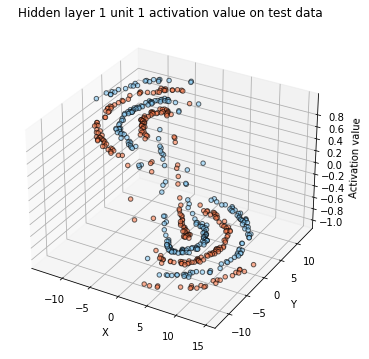

(523,)


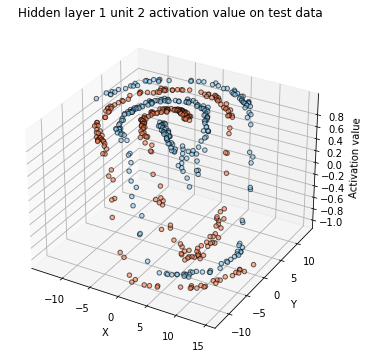

(523,)


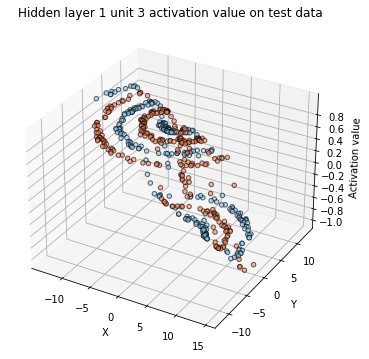

(523,)


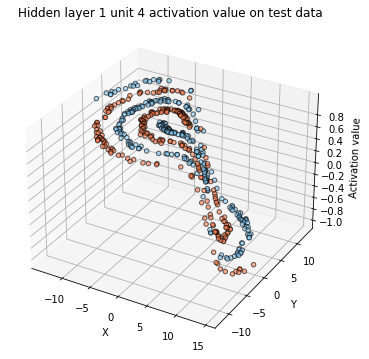

(523,)


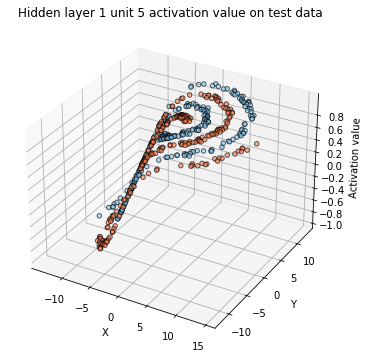

(523,)


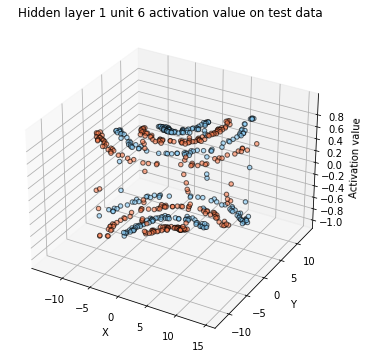

(523,)


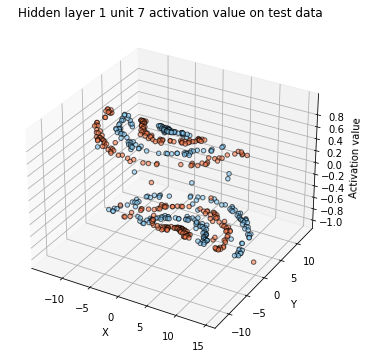

(523,)


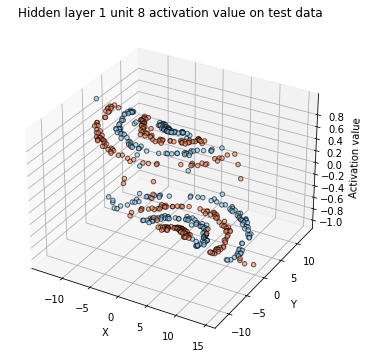

(523,)


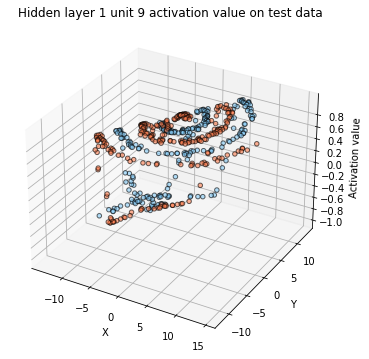

(523,)


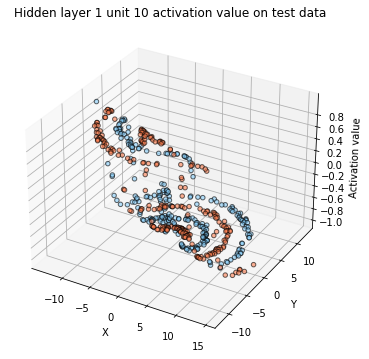

(523,)


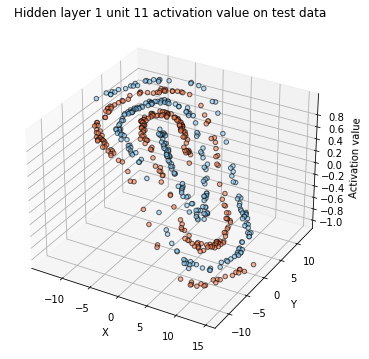

(523,)


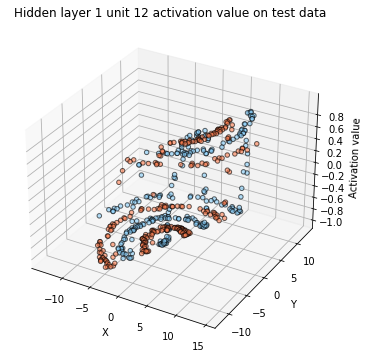

(523,)


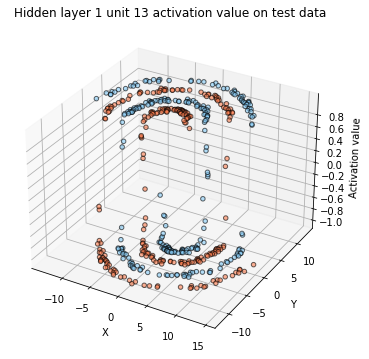

(523,)


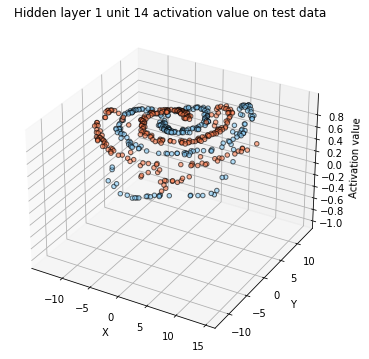

(523,)


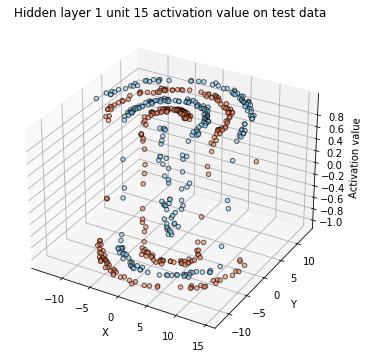

(523,)


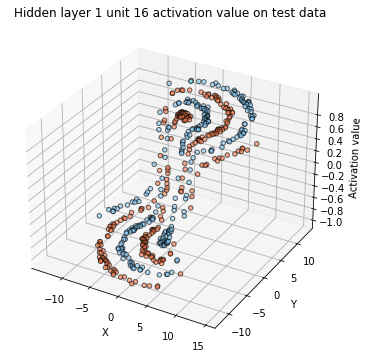

(523,)


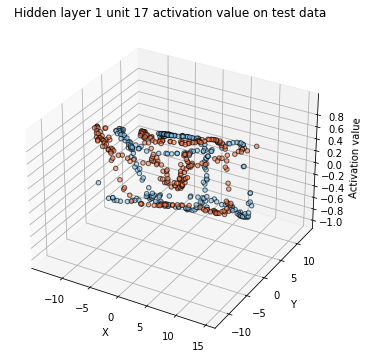

(523,)


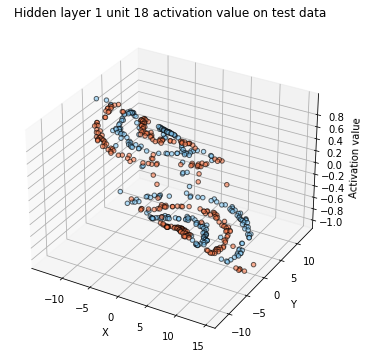

(523,)


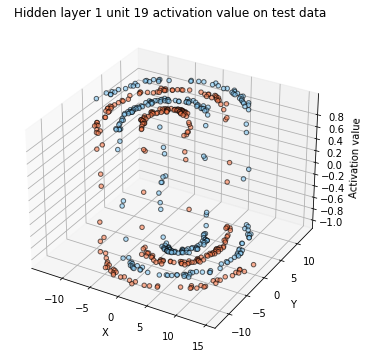

(523,)


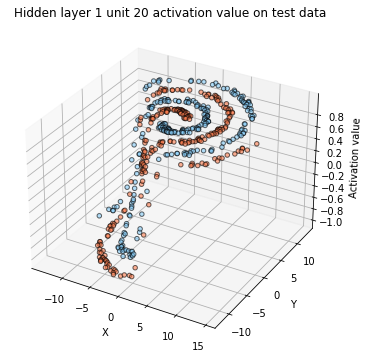

In [365]:
# plotting hidden units activation value for first hidden layer on test data
m1,n1=g1_test.shape
for i in range(m1):
    Z=g1_test[i]
    print(Z.shape)
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(test[0][:262],test[1][:262], Z[:262], c='coral',alpha=0.6,edgecolors='black')
    ax.scatter(test[0][263::],test[1][263::], Z[263::], c='lightskyblue',alpha=0.6,edgecolors='black')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Activation value')
    ax.set_title(f'Hidden layer 1 unit {i+1} activation value on test data')
    ax.set_zticks(np.arange(-1,1,0.2))
    plt.savefig("FCNN_NLS_Results\\Part1_Q2_"+str(i+1)+"hidden_neuron_test_layer1"+str(J)+".png")
    plt.show()

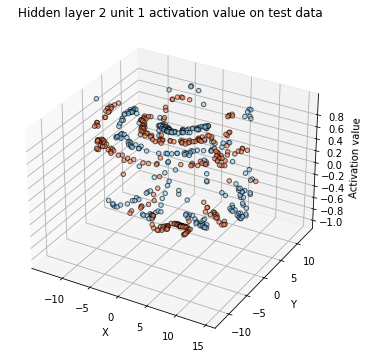

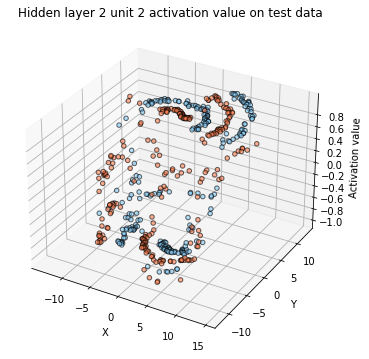

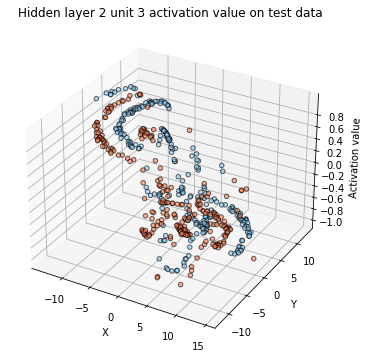

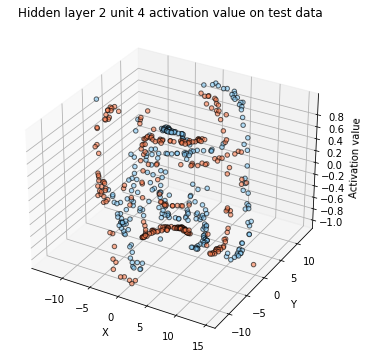

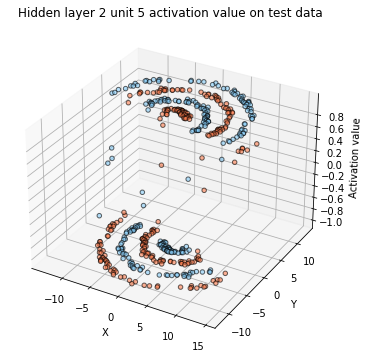

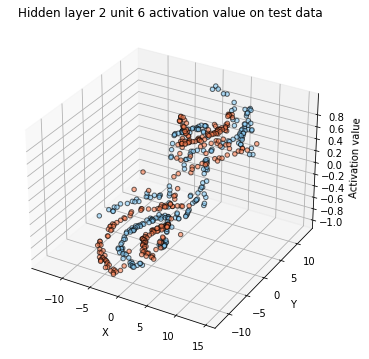

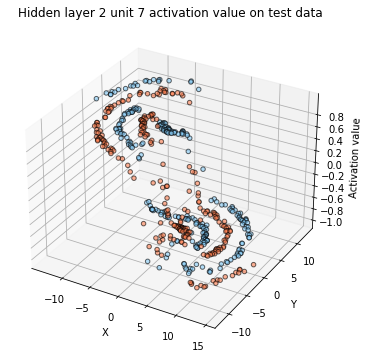

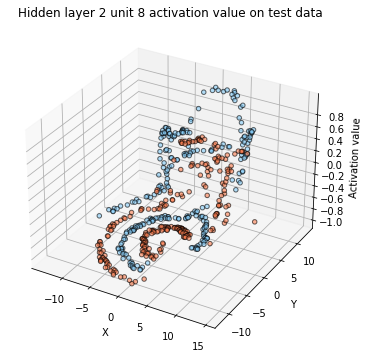

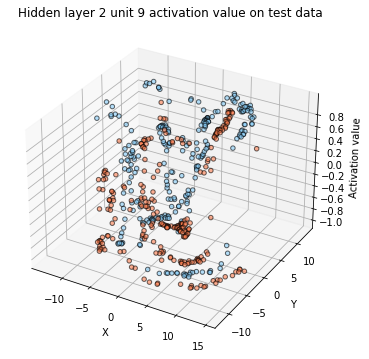

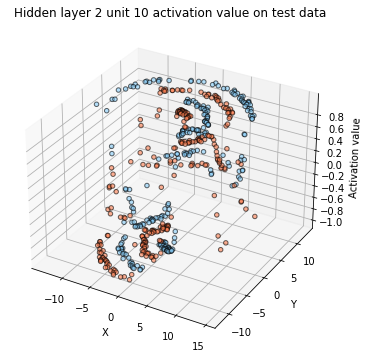

In [366]:
# plotting hidden units activation value for second hidden layer on test data

m1,n1=g2_test.shape
for i in range(m1):
    Z=g2_test[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(test[0][:262],test[1][:262], Z[:262], c='coral',alpha=0.6,edgecolors='black')
    ax.scatter(test[0][263::],test[1][263::], Z[263::], c='lightskyblue',alpha=0.6,edgecolors='black')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Activation value')
    ax.set_title(f'Hidden layer 2 unit {i+1} activation value on test data')
    ax.set_zticks(np.arange(-1,1,0.2))
    plt.savefig("FCNN_NLS_Results\\Part1_Q2_"+str(i+1)+"hidden_neuron_test_layer2"+str(L)+".png")
    plt.show()

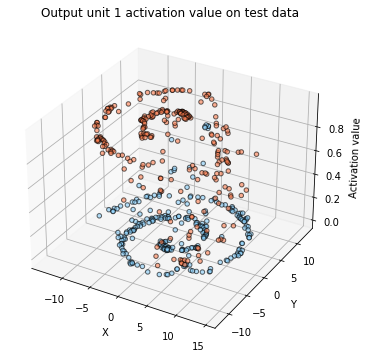

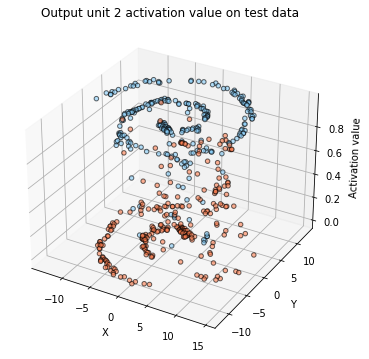

In [367]:
# plotting output units activation value on test data

m1,n1=s_test.shape
for i in range(m1):
    Z=s_test[i]
    fig = plt.figure(figsize=(6,6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(test[0][:262],test[1][:262], Z[:262], c='coral',alpha=0.6,edgecolors='black')
    ax.scatter(test[0][263::],test[1][263::], Z[263::], c='lightskyblue',alpha=0.6,edgecolors='black')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Activation value')
    ax.set_title(f'Output unit {i+1} activation value on test data')
    ax.set_zticks(np.arange(0,1,0.2))
    plt.savefig("FCNN_NLS_Results\\Part1_Q2_"+str(i+1)+"output_neuron_test_.png")
    plt.show()